#Deteksi Jenis Sampah Menggunakan Yolov8

Notebook ini berisi mengenai pendeteksian jenis sampah menggunakan arsitektur YOLOV8 dengan dataset kustom. Arsitektur YOLOv8 ini dipilih karena memiliki akurasi dan kecepatan lebih tinggi dari model-model YOLO sebelumnya. Perbandingan beberapa versi YOLO pada dataset COCO ditunjukkan pada gambar berikut.

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1py7yt7_znzhfw40Keb5r_opgl8ErdthR"
  >
</div>

### **Pengunduhan Yolov8**

Pengunduhan Yolov8 dari Ultralytics

In [ ]:
#Install folder file ultralystics dan IPython pada Google Drive individu

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.2/78.2 GB disk)


In [ ]:
#Import dan Install file-file YOLO pada Google Drive individu

from ultralytics import YOLO                #Impor file YOLO
from IPython.display import display, Image  #Untuk penampilan gambar

Mounting Google Drive

In [ ]:
#Menghubungkan Google Colab dan Google Drive

from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### **Persiapan Dataset**

Persiapan dataset dilakukan dengan mengumpulkan data melalui foto kamera dan internet. Total gambar yang diambil sebanyak 3829 dengan masing-masing kelas anorganik 1560, B3 1430, dan organik 1370 dengan beberapa gambar berisi 2 hingga 3 kelas. Anotasi data sampah dilakukan menggunakan roboflow dengan langkah sebagai berikut.

####Langkah 1: Pembuatan Proyek

Pembuatan proyek dilakukan pada website [roboflow](https://app.roboflow.com/) dengan memilih kategori untuk proyek berupa deteksi objek.

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1-OpAnOq696pEyTUkXCBJrTovVVETa-wc"
  >
</div>

###Langkah 2: Unggah Gambar
Mengunggah gambar dari data lokal yang sudah dikumpulkan kedalam [roboflow](https://app.roboflow.com/).

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=186a7B6LCco_PfSAbSyRY61e9UFj6VOKD"
  >
</div>

###Langkah 3: Anotasi Gambar
Anotasi gambar dilakukan dengan pemberian label bounding box pada masing-masing objek secara manual. Dimana label yang dimaksudkan berupa anorganik, B3, dan organik.

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1qC9YrX1KWJpcNWnC-FYlZx9iHeTEwxxB"
  >
</div>

###Langkah 4: Pembagian Dataset
Pembagian dataset dimaksudkan untuk membagi dataset kedalam tiga jenis yaitu train, validation, dan test. Dengan pembagian data dari keseluruhan dataset berturut-turut yaitu 70%, 20%, dan 10%. Serta perubahan ukuran gambar dengan memprosesnya menjadi 640x640 piksel dengan bantuan [roboflow](https://app.roboflow.com/).

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1c3Xhng0FupDwNyU9_FIYNZifIPvET0CO"
  >
</div>

###Langkah 5: Ekspor Dataset
Langkah terakhir adalah ekspor dataset dalam format YOLOv8. Bertujuan untuk membuat gambar dan anotasi dapat langsung diekstrak dari laman [roboflow](https://app.roboflow.com/) secara langsung.

<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1q_GtlyYRZ_kAk_98tgeAFaYnAKXIHgHk"
  >
</div>

Installasi akses Roboflow dalam Google Colab

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

#Inisialisasi intall Roboflow dalam Google Colab
!pip install roboflow

#Menghubungkan Google Colab dan Roboflow
#Serta download file dasar YOLOv8 dan Dataset yang dipakai
from roboflow import Roboflow
rf = Roboflow(api_key="rjBGMgwXMf6BsXXbvLJq")
project = rf.workspace("kelompok-ksc").project("garbage_detection-xgoco")
dataset = project.version(1).download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.5/68.5 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.9 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Succ

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Garbage_Detection-1 in yolov8:: 100%|██████████| 7670/7670 [00:01<00:00, 5060.02it/s]


###**Pelatihan**

Pelatihan dilakukan sebanyak 200 epoch dengan bobot YOLO yang dilatih adalah "yolov8s.pt". Pada pelatihan dilakukan fine tuning terhadap konfigurasi epoch. Bobot "yolov8s.pt" memiliki komputasi tercepat tetapi memiliki akurasi yang lebih rendah dibandingkan dengan model YOLOv8 lainnya.

In [ ]:
#Pelatihan dipecah per 10 epoch untuk menghindari keterbatasan google colab
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True
#Log dibawah merupakan hasil 10 epoch pertama

/content
100% 21.5M/21.5M [00:00<00:00, 150MB/s] 

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/Garbage_Detection-1/data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, ke

Hasil Pelatihan

In [ ]:
#List data dan files hasil pelatihan
!ls {HOME}/runs/detect/train/

args.yaml					    results.csv		   val_batch1_labels.jpg
confusion_matrix.png				    results.png		   val_batch1_pred.jpg
events.out.tfevents.1702901680.753dc29a76b9.2108.0  train_batch0.jpg	   val_batch2_labels.jpg
F1_curve.png					    train_batch1.jpg	   val_batch2_pred.jpg
P_curve.png					    train_batch2.jpg	   weights
PR_curve.png					    val_batch0_labels.jpg
R_curve.png					    val_batch0_pred.jpg


In [ ]:
#Data-data tolak ukur hasil pelatihan pada YOLOv8
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)            #Penampilan grafik-grafik hasil pelatihan
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)   #Penampilan matriks confusion
Image(filename=f'{HOME}/runs/detect/train/F1_curve.png', width=600)           #Penampilan kurva F1
Image(filename=f'{HOME}/runs/detect/train/R_curve.png', width=600)            #Penampilan kurva recall
Image(filename=f'{HOME}/runs/detect/train/P_curve.png', width=600)            #Penampilan kurva precision
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)    #Penampilan hasil label pada pelatihan

Hasil pelatihan Yolov8 pada 200 epoch adalah sebagai berikut

**Hasil pelatihan**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1gmc-E_lrdJGH3aGdgVh8AI6Ey8HJvRIb"
  >
</div>

**Confusion Matrix**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1DBd9lcPHg5t43oGQNH0Xxw-vVSEf13T0"
  >
</div>

**Kurva F1**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1iuar0EvkNBWX0Ta908GZ4-8CakA9_bGh"
  >
</div>

**Kurva Recall**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1VoCrrx9z-eJueUfBXKFsSqV3SYPceSta"
  >
</div>

**Kurva Precision**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1Xcvda3Pl4ivATIKzLpo2MOgy9VFH1Ai6"
  >
</div>

**Label Data Latih**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1fBrSNV4sIkQZgBG08cwtlbkFPE1YjU2M"
  >
</div>

**Validasi Data Latih**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1fAFYaFNSX9qOmO7f7G2CAbAFXahiAZrs"
  >
</div>

###**Validasi Model**

Validasi data model menggunakan bobot yang telah dilatih sebelumnya sebanyak 200 epoch

In [ ]:
#Inisialisai validasi menggunakan data hasil pelatihan 200 epoch pada YOLOv8
%cd {HOME}
!yolo task=detect mode=val model=/content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V8/yolov8_epovh200/last.pt data={dataset.location}/data.yaml

/content
2023-12-18 12:34:55.572739: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-18 12:34:55.572811: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-18 12:34:55.574292: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-18 12:34:56.661391: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Garbage_Detection-1/valid/labels

Pengujian model kustom dengan transfer learning

In [ ]:
#Inisialisasi pengujian model kustom dengan transfer learning, dengan mode prediksi dari data hasil pelatihan 200 epoch dengan confidence threshold 0.25 pada YOLOv8
%cd {HOME}
#model = letak dari bobot terakhir hasil dari pelatihan pre-trained
!yolo task=detect mode=predict model=/content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V8/yolov8_epovh200/last.pt conf=0.25 source={dataset.location}/test/images save=True

/content
2023-12-18 12:35:45.502538: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-18 12:35:45.502607: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-18 12:35:45.504505: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-18 12:35:47.000096: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126745 parameters, 0 gradients, 28.4 GFLOPs
image 1/389 /content/datasets/Garbage_Detection-1/test/images/00

Menampilkan hasil uji model kustom dengan test dataset

In [ ]:
#Inisialisasi penampilan hasil uji model kustom dengan transfer learning.
import glob
from IPython.display import Image, display

#Penampilan gambar hasil uji.
for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=200))
      print("\n")

#**Perbandingan dengan Yolov5**

###**Pengunduhan Yolov5**

In [ ]:
#Inisialisasi pengunduhan bahan YOLOv5
%cd /content/gdrive/MyDrive
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

/content/gdrive/MyDrive
Cloning into 'yolov5'...
remote: Enumerating objects: 16103, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 16103 (delta 4), reused 6 (delta 0), pack-reused 16089
Receiving objects: 100% (16103/16103), 14.82 MiB | 15.35 MiB/s, done.
Resolving deltas: 100% (11023/11023), done.
/content/gdrive/MyDrive/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


Pemasangan library yang dibutuhkan

In [ ]:
!pip install -qr requirements.txt  # pemasangan library yang dibutuhkan
import torch

from IPython.display import Image, clear_output  #Untuk penampilan gambar
from utils.downloads import attempt_download  #Untuk download dataset

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.1 MB/s eta 0:00:00
Setup complete. Using torch 2.1.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


###**Pengunduhan Dataset**

Dataset yang diunduh dalam model Yolov5

In [ ]:
#Install akses Roboflow
!pip install roboflow

#Menghubungkan Google Colab dan Roboflow
#Download file dasar YOLOv5 dan Dataset yang akan dipakai
from roboflow import Roboflow
rf = Roboflow(api_key="rjBGMgwXMf6BsXXbvLJq")
project = rf.workspace("kelompok-ksc").project("garbage_detection-xgoco")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Garbage_Detection-1 in yolov5pytorch:: 100%|██████████| 7670/7670 [00:44<00:00, 174.20it/s]


In [ ]:
#Akses ke Google Drive, folder file-file YOLOv5
%cd /content/gdrive/MyDrive/yolov5

/content/gdrive/MyDrive/yolov5


###**Konfigurasi Model**

In [ ]:
#Inisialisasi model pra-latih
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#Akses ke model pra-latih
%cat /content/gdrive/MyDrive/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#Inisialisasi library untuk menulis template
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/gdrive/MyDrive/yolov5/models/custom_yolov5s.yaml

# parameter
nc: {num_classes}  #jumlah class
depth_multiple: 0.33  #model depth multiple
width_multiple: 0.50  #layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

###**Pelatihan**

Pelatihan Yolov5 dilakukan dengan total 200 epoch dan bobot yolov5s

In [ ]:
%%time
%cd /content/gdrive/MyDrive/yolov5
#Inisialisasi pelatihan YOLOv5
!python train.py --img 640 --batch 16 --epochs 10 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights /content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V5/epoch60/last.pt --name yolov5s_results  --cache
#Log yang ditampilkan berikut merupakan 10 epoch pertama

/content/gdrive/MyDrive/yolov5
2023-12-18 12:45:45.532827: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-18 12:45:45.532879: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-18 12:45:45.534211: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-18 12:45:46.598466: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V5/epoch60/last.pt, cfg=./models/custom_yolov5s.yaml, data=/content/gdrive/MyDrive/yolov5/Garbage_Detection-1/data.yaml, hyp=data/hyps/hyp.

Hasil Pelatihan

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
#Penampilan data-data tolak ukur hasil pelatihan YOLOv5
Image(filename='/content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V5/epoch200/results.png'), width=1000

Hasil pelatihan YOLOv5 pada 200 epoch adalah sebagai berikut

**Hasil pelatihan**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1G0giujYFm1IKeSwBi9i5fRYcZI08YMVi"
  >
</div>

**Confusion Matrix**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1FTSYYIIgyrnS4xe5hzGjlthPCvOV0stL"
  >
</div>

**F1**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1FRlJR3z3gUa7ZzAUSCPYwpIJI60-WBl6"
  >
</div>

**Recall**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1G9dQ376voRJSJyo7GmJ5zpZcCGV3lzDZ"
  >
</div>

**Precision**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1FS8hL3l1-OD7JXcfDBGFwY5Vgx_6pABf"
  >
</div>

**Label Data Latih**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1Fl6q2j8AuVZe0X17uAZBfV_UfbTZGOo_"
  >
</div>

**Validasi Data Latih**
<div align="center">
  <img
    width="640"
    src="https://drive.google.com/uc?export=view&id=1FjxnjZ84_RHgUZO3_G_73LGYnQ0pz5mP"
  >
</div>

###**Validasi Model**

In [ ]:
#Akses folder bobot hasil pelatihan YOLOv5 dengan 200 epoch
%ls runs/train/yolov5s_results/weights

In [ ]:
#Validasi model YOLOv5 menggunakan bobot hasil 200 epoch
%cd /content/gdrive/MyDrive/yolov5
!python detect.py --weights /content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V5/epoch200/weights/best.pt --conf 0.25 --source /content/gdrive/MyDrive/yolov5/Garbage_Detection-1/test/images

/content/gdrive/MyDrive/yolov5
detect: weights=['/content/gdrive/Shareddrives/TUGAS_BESAR_KSC/BOBOT_YOLO_V5/epoch200/weights/last.pt'], source=/content/gdrive/MyDrive/yolov5/Garbage_Detection-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7251912 parameters, 0 gradients
image 1/389 /content/gdrive/MyDrive/yolov5/Garbage_Detection-1/test/images/00000092-2-_jpg.rf.3c6d4be133a843d0cdb706ee67f52f5e.jpg: 640x640 (no detections), 12.5ms
image 2/389 /content/gdrive/MyDrive/yolov5/Garbage_Detection

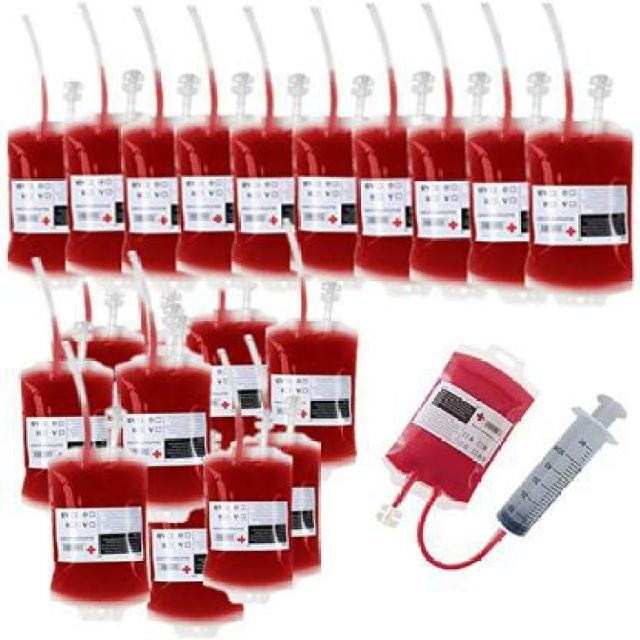

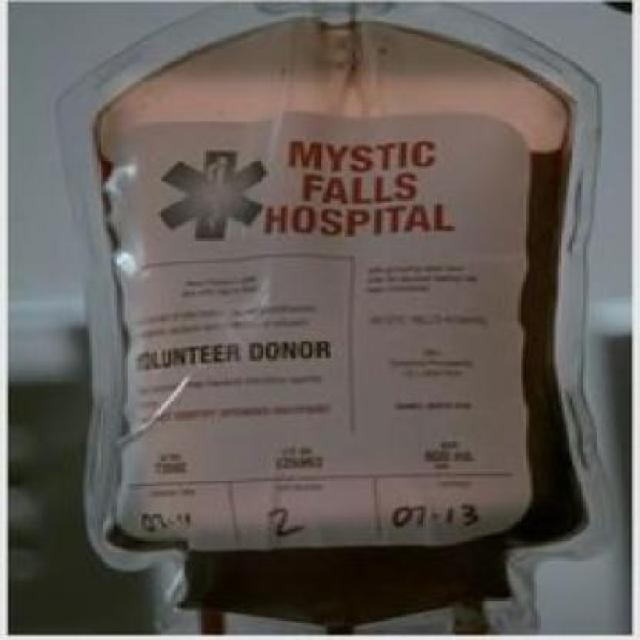

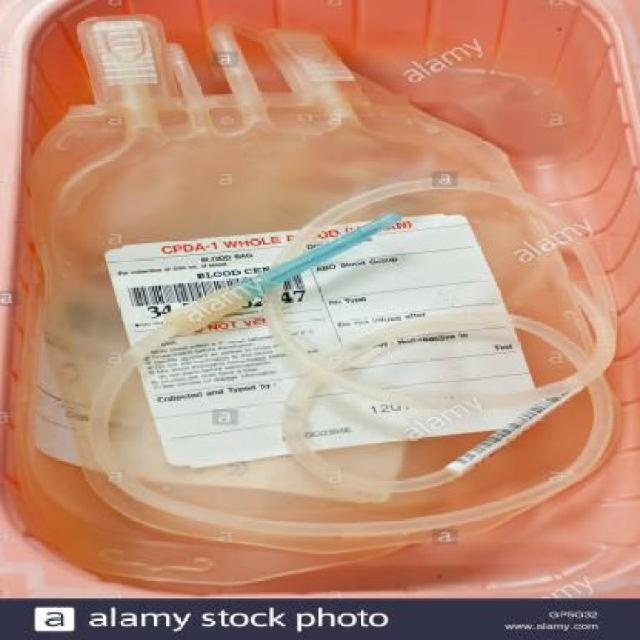

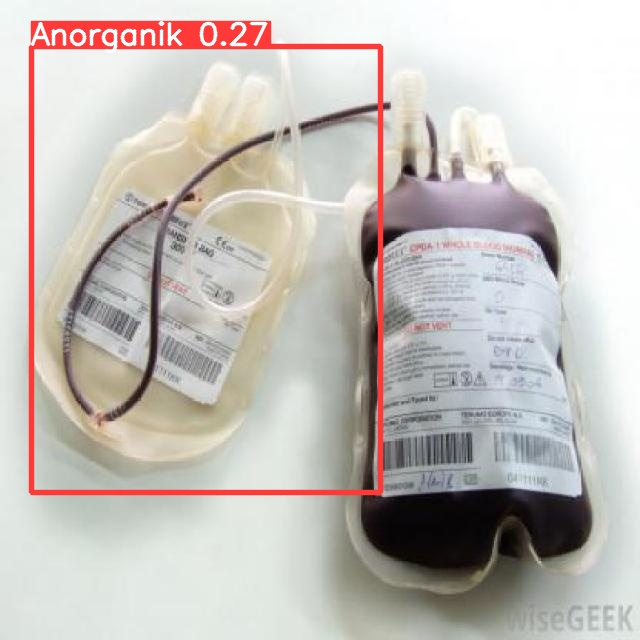

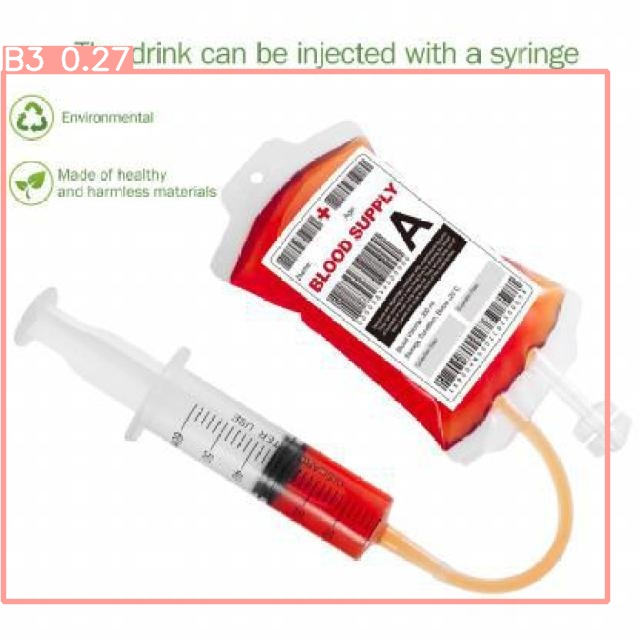

...

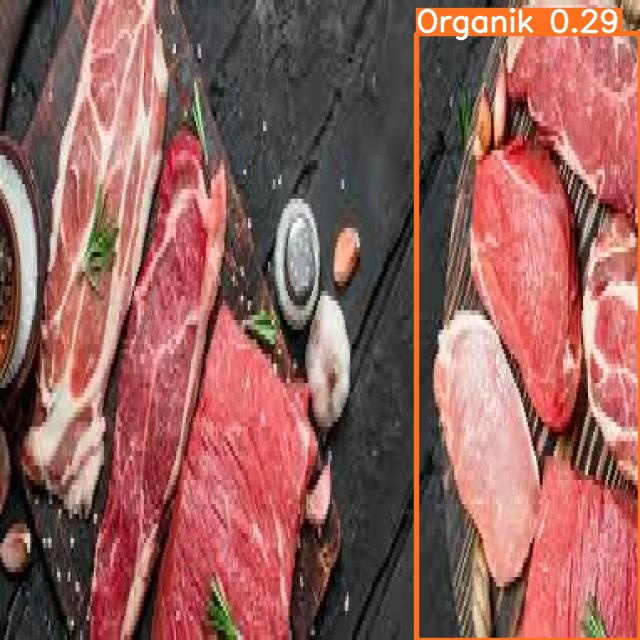

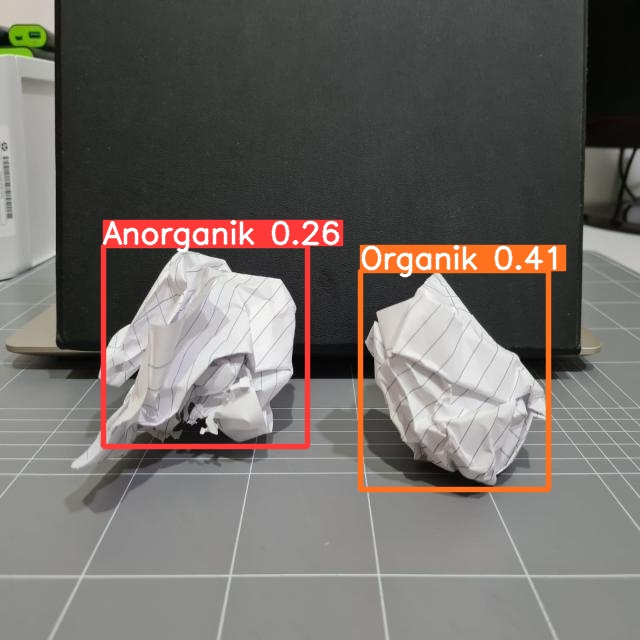

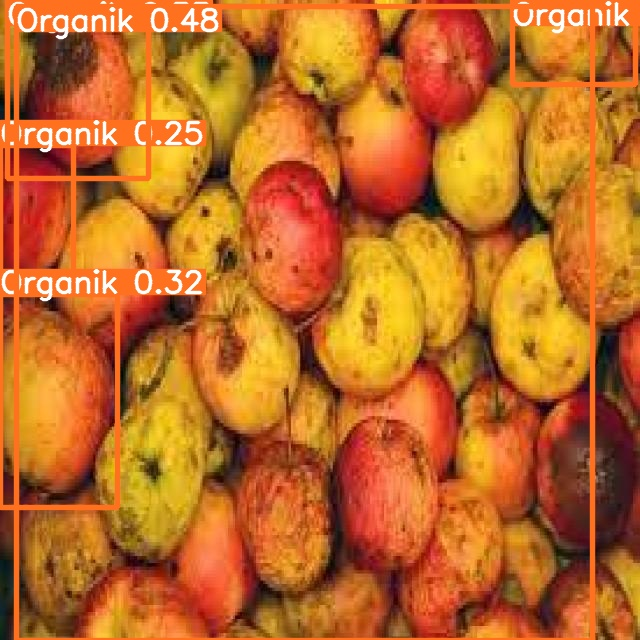

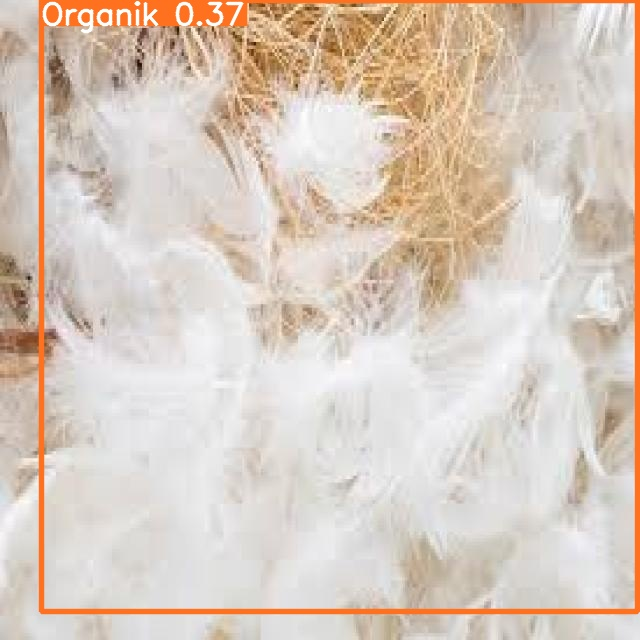

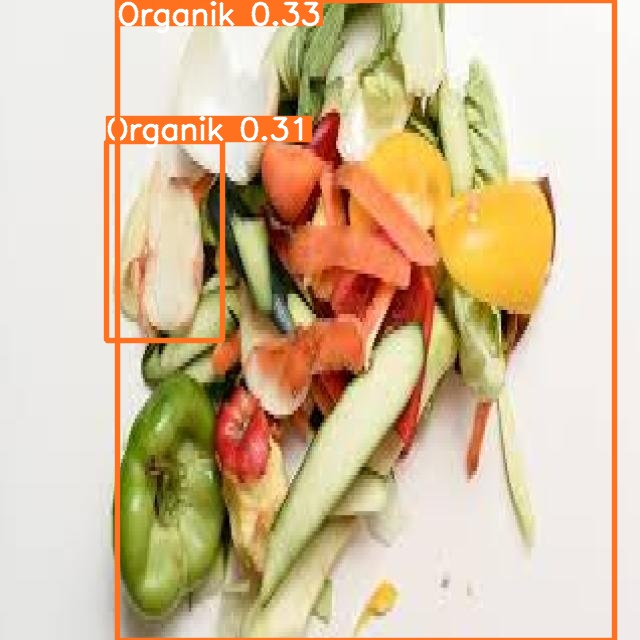

In [ ]:
#Penampilan hasil validasi YOLOv5
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/gdrive/MyDrive/yolov5/runs/detect/exp4/*.jpg')[:100]: #assuming JPG
    display(Image(filename=imageName, width=200))